In [1]:
import sys
sys.path.append('../')
sys.path.append('../4_watershed')
sys.path.append('../splinedistm')

import matplotlib.pyplot as plt
import numpy as np

from csbdeep.utils import normalize
from glob import glob
from skimage import io
from splinedist.models import SplineDist2D
from stardist.matching import matching_dataset
from stardist.models import StarDist2D
from tqdm import tqdm

from watershedfunc import avg_precision, evaluate_all, f1_score, get_best_params, get_confusion_matrix_vals, watershed_seg
from utils import save_scores_csv, show_test_images, taus

In [2]:
image_dir = '../images'
nuclei_4t1_dir = f'{image_dir}/4t1'
smfish_4t1_dir = f'{image_dir}/4t1-smfish'

In [3]:
# Load images in train and test dirs
X_test_names = glob(f'{nuclei_4t1_dir}/test/images/*.tif')
X_test_names.extend(glob(f'{nuclei_4t1_dir}/train/images/*.tif'))
X_test_names.sort(key=lambda name: name[-6:])
X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, X_test_names))]

In [4]:
# Load masks in train and test dirs
Y_test_names = glob(f'{nuclei_4t1_dir}/test/masks/*.tif')
Y_test_names.extend(glob(f'{nuclei_4t1_dir}/train/masks/*.tif'))
Y_test_names.sort(key=lambda name: name[-6:])
Y_test = list(map(io.imread, Y_test_names))

# Pretrained StarDist model

Found model '2D_versatile_fluo' for 'StarDist2D'.
  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
100%|██████████| 9/9 [00:22<00:00,  2.47s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=7, tp=52, fn=307, precision=0.8813559322033898, recall=0.14484679665738162, accuracy=0.14207650273224043, f1=0.24880382775119617, n_true=359, n_pred=59, mean_true_score=0.10487541937217255, mean_matched_score=0.724043760665576, panoptic_quality=0.18014485911296627, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=8, tp=51, fn=308, precision=0.864406779661017, recall=0.14206128133704735, accuracy=0.13896457765667575, f1=0.24401913875598086, n_true=359, n_pred=59, mean_true_score=0.10434587316543079, mean_matched_score=0.7345131071841109, panoptic_quality=0.17923525582004618, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=8, t

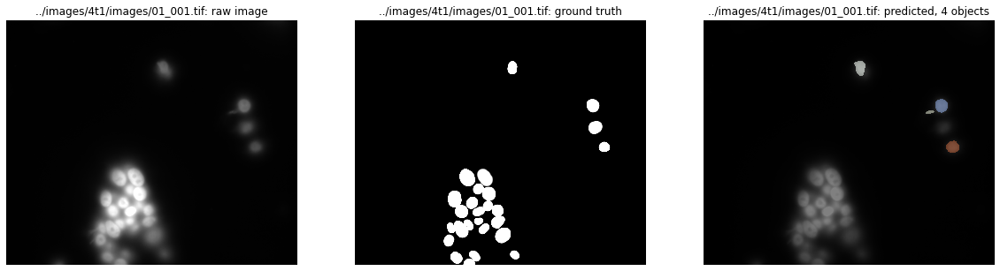

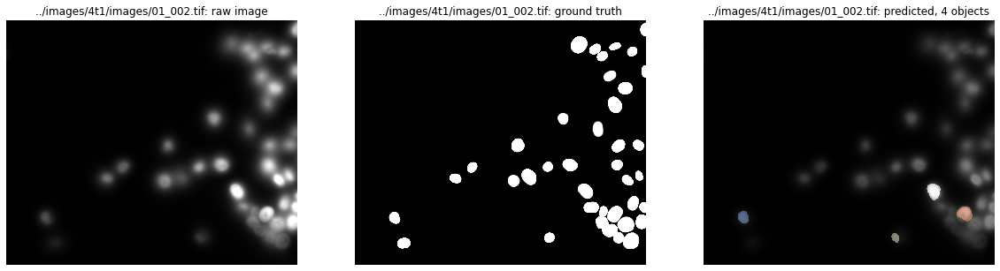

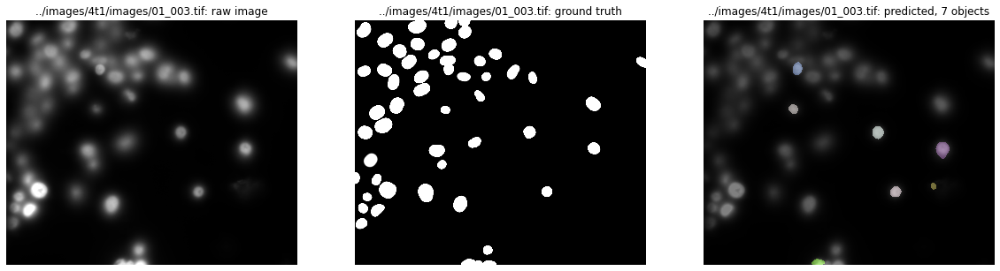

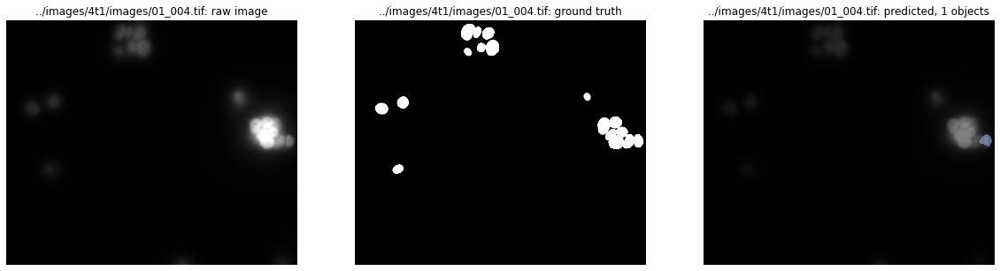

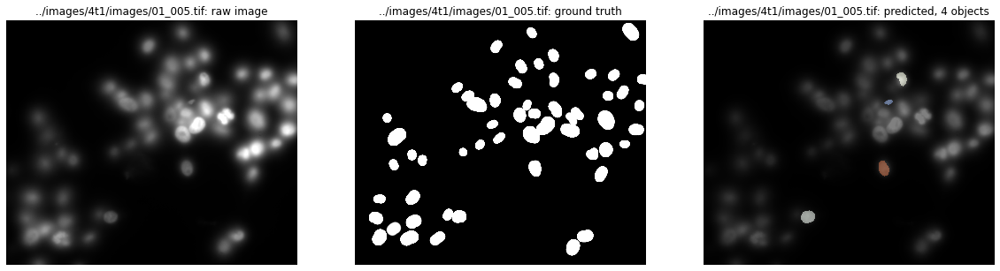

...

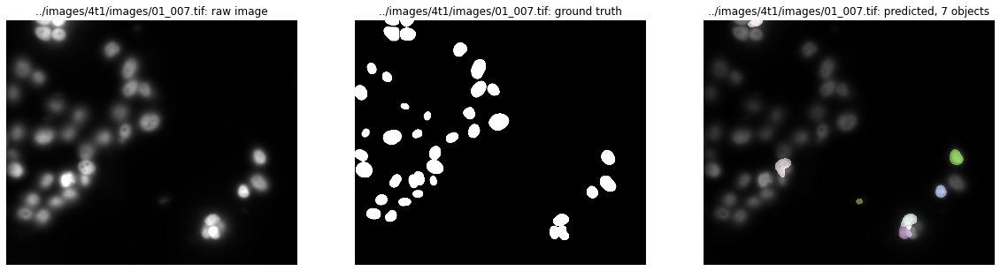

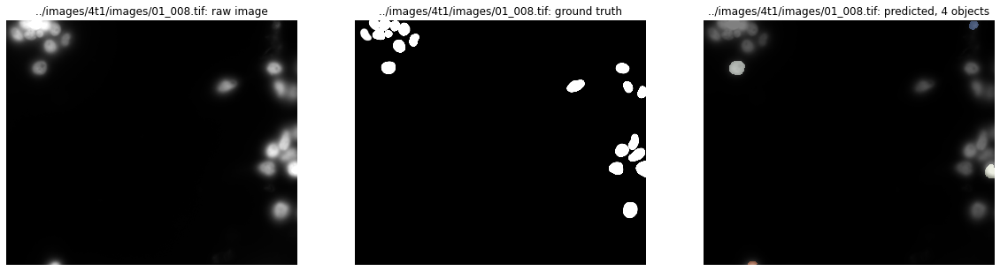

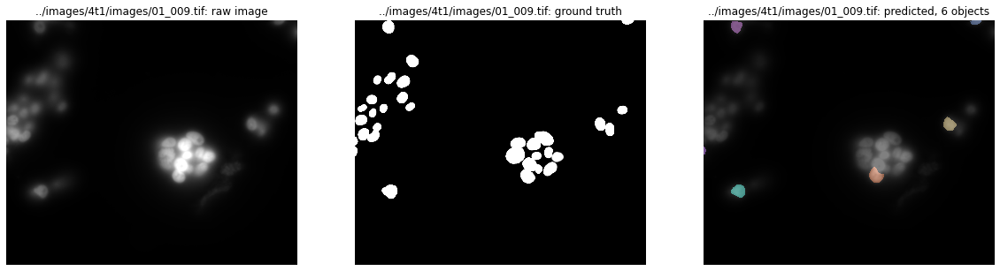

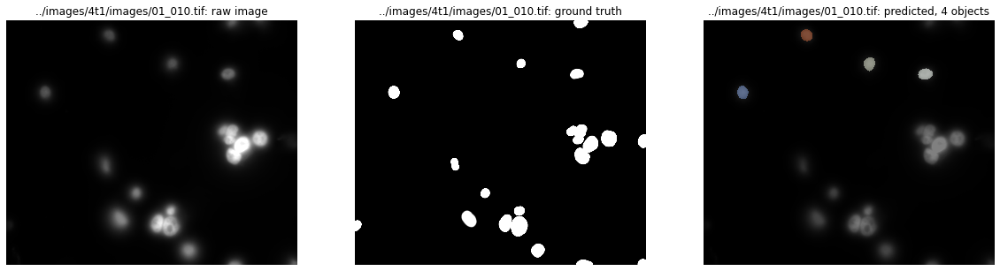

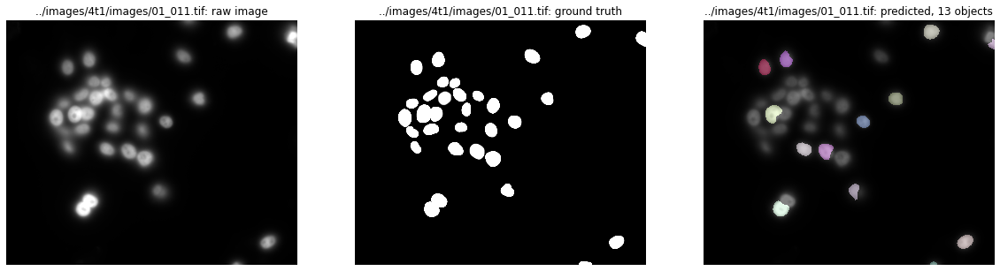

In [4]:
# Load pretrained model for 2d fluorescent images
pretrained_stardist_model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Predict
Y_pred = [pretrained_stardist_model.predict_instances(x, n_tiles=pretrained_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_pretrained_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Pretrained StarDist model + 5 Additional U2OS images

  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
100%|██████████| 9/9 [00:22<00:00,  2.55s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=9, tp=243, fn=116, precision=0.9642857142857143, recall=0.6768802228412256, accuracy=0.6603260869565217, f1=0.795417348608838, n_true=359, n_pred=252, mean_true_score=0.34721918937085794, mean_matched_score=0.5129699135149711, panoptic_quality=0.4080251685241833, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=34, tp=218, fn=141, precision=0.8650793650793651, recall=0.6072423398328691, accuracy=0.55470737913486, f1=0.7135842880523732, n_true=359, n_pred=252, mean_true_score=0.33563123036821424, mean_matched_score=0.5527138151476556, panoptic_quality=0.3944078942788508, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=84, tp=168, fn=191, precision=0.6666666666666666, recall=0

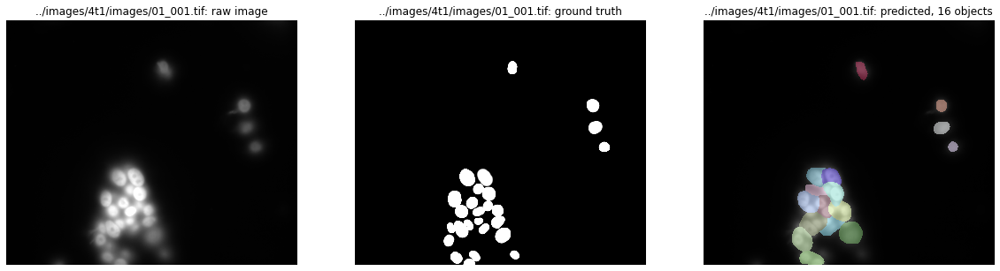

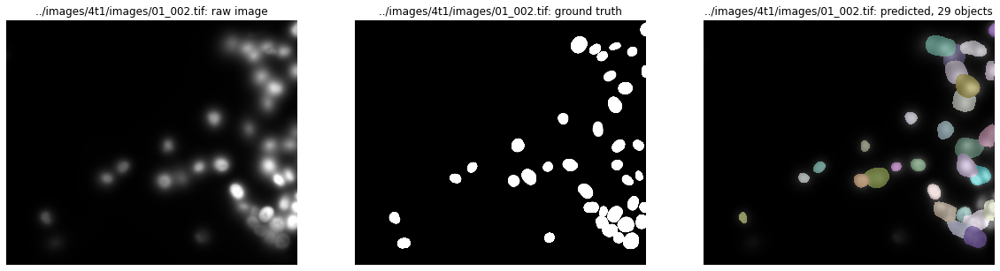

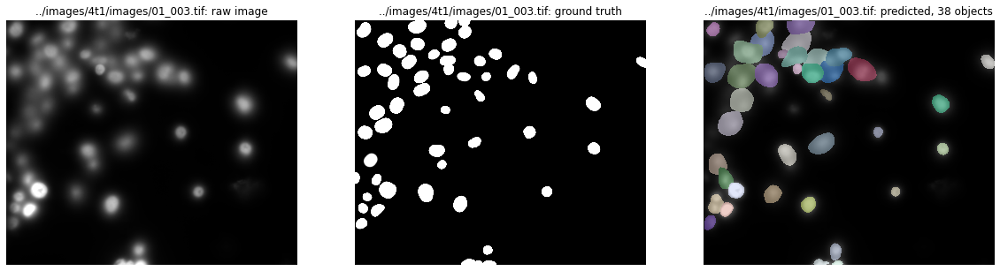

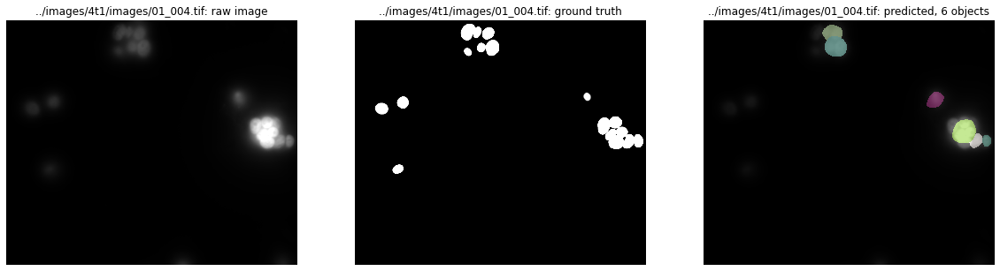

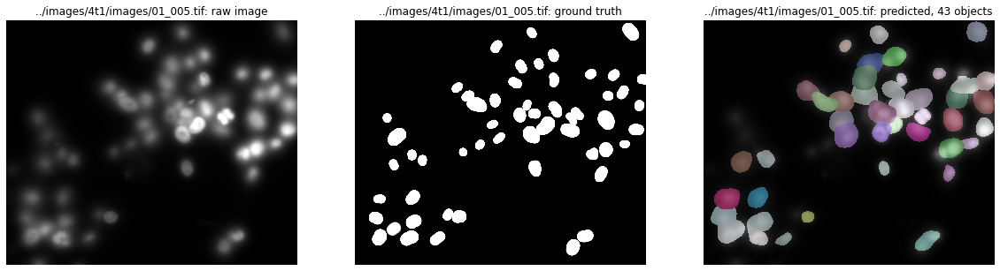

...

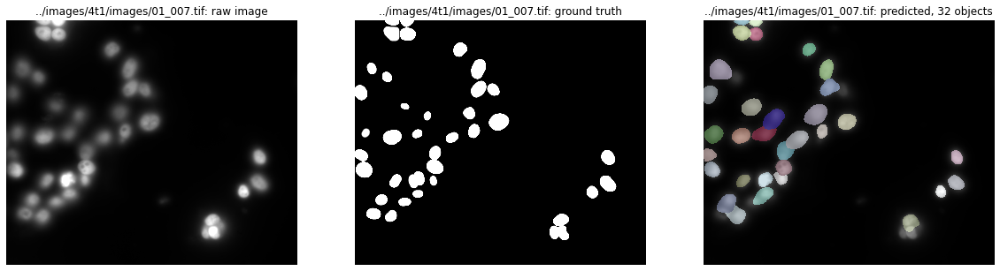

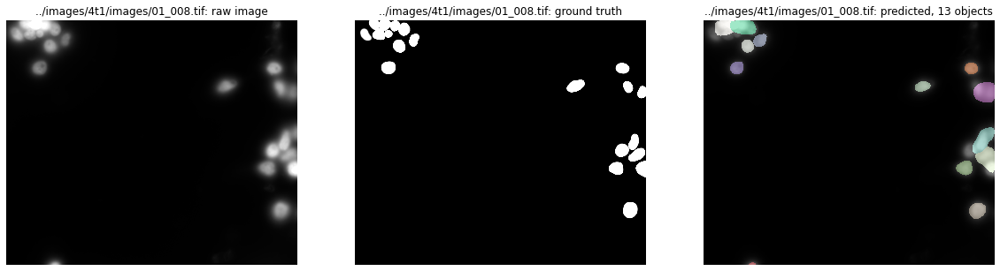

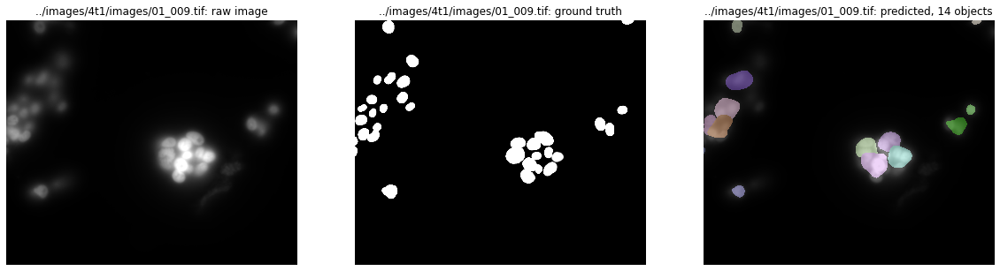

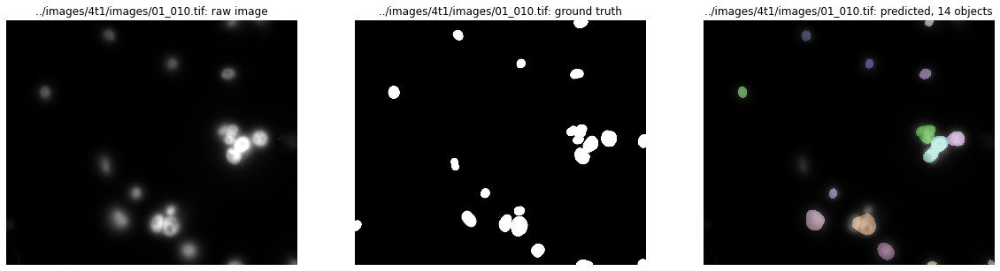

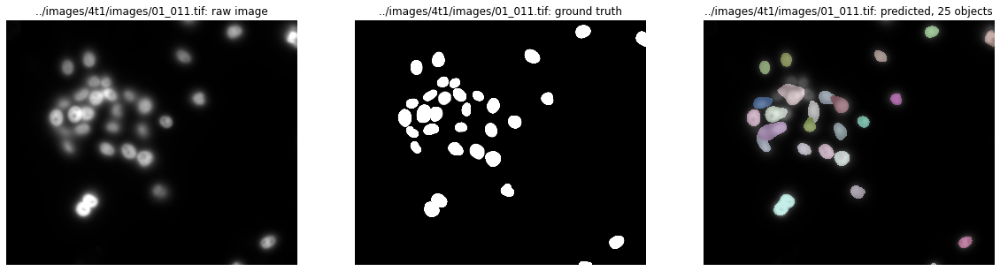

In [6]:
# Load model
pretrained_add5_stardist_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_5', 
                                 basedir='../0_pretrained_stardist_merfish_add_train/models')

# Predict
Y_pred = [pretrained_add5_stardist_model.predict_instances(x, n_tiles=pretrained_add5_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_pretrained_add5_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Pretrained StarDist model + 10 Additional U2OS images

  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
100%|██████████| 9/9 [00:23<00:00,  2.61s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=16, tp=248, fn=111, precision=0.9393939393939394, recall=0.6908077994428969, accuracy=0.6613333333333333, f1=0.7961476725521669, n_true=359, n_pred=264, mean_true_score=0.34684894270440897, mean_matched_score=0.5020918162535598, panoptic_quality=0.39973923091776187, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=47, tp=217, fn=142, precision=0.821969696969697, recall=0.6044568245125348, accuracy=0.5344827586206896, f1=0.6966292134831461, n_true=359, n_pred=264, mean_true_score=0.33207150710880246, mean_matched_score=0.5493717560002769, panoptic_quality=0.3827084142923277, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=81, tp=183, fn=176, precision=0.6931818181818182, reca

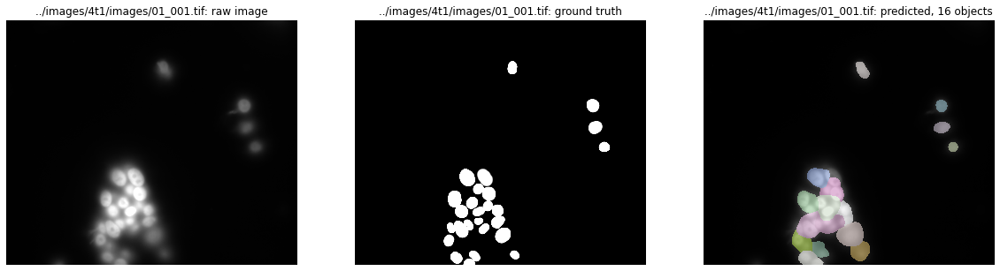

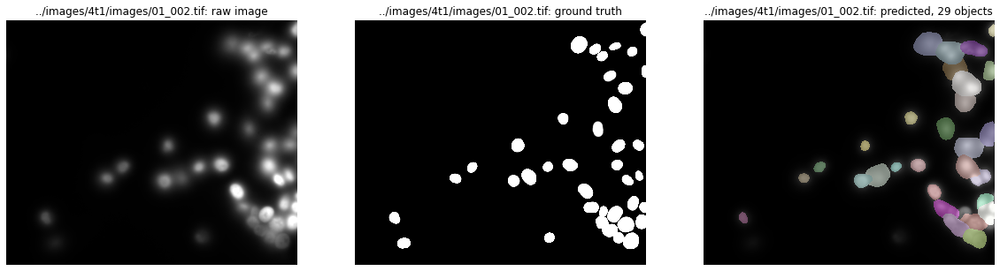

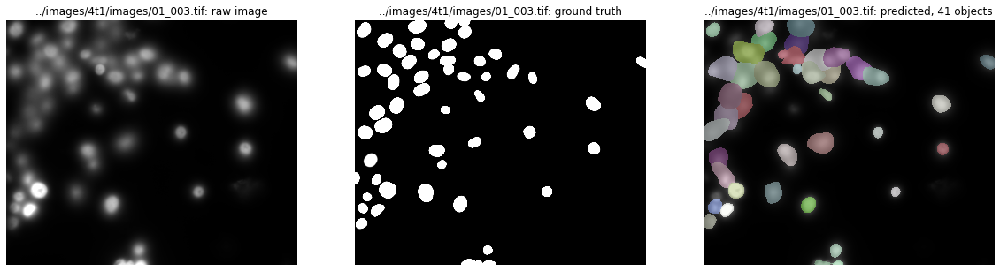

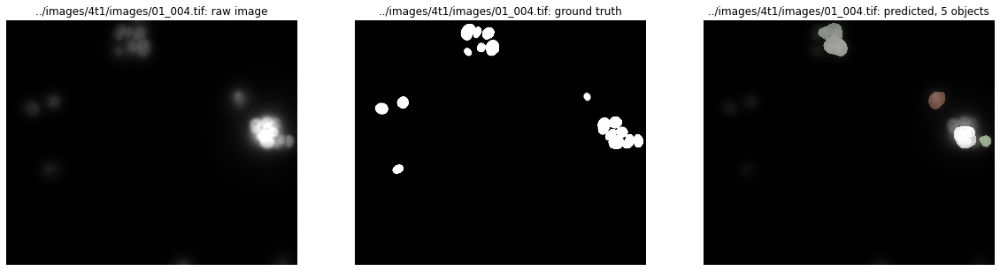

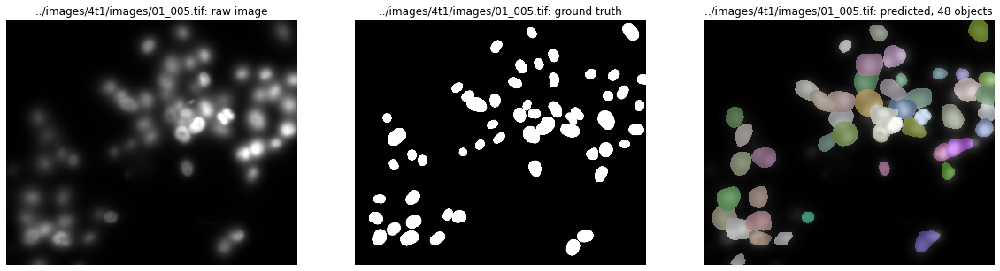

...

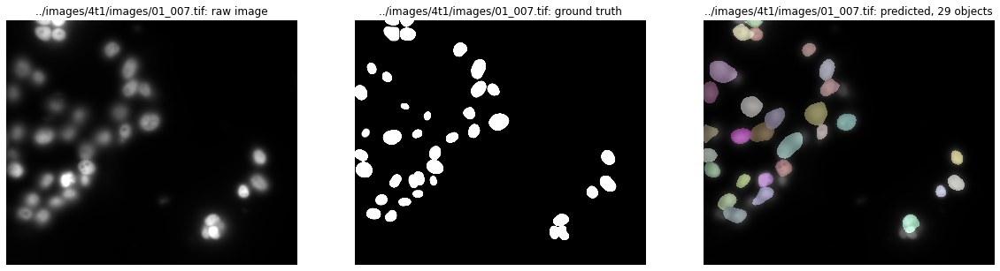

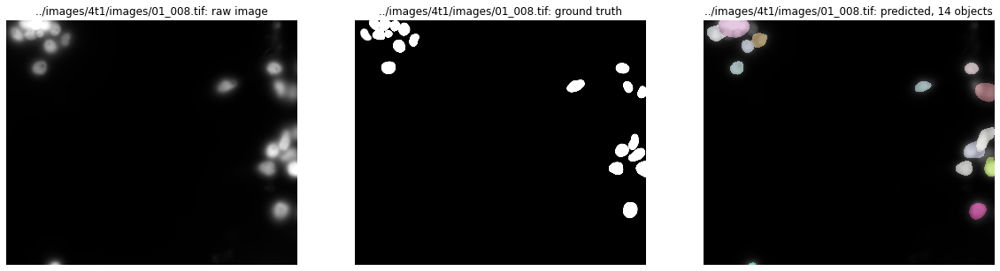

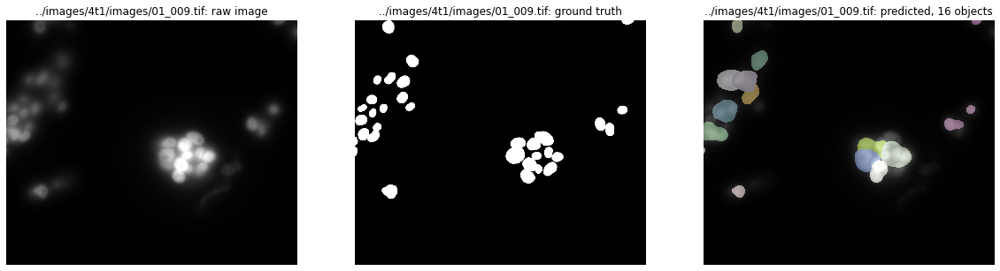

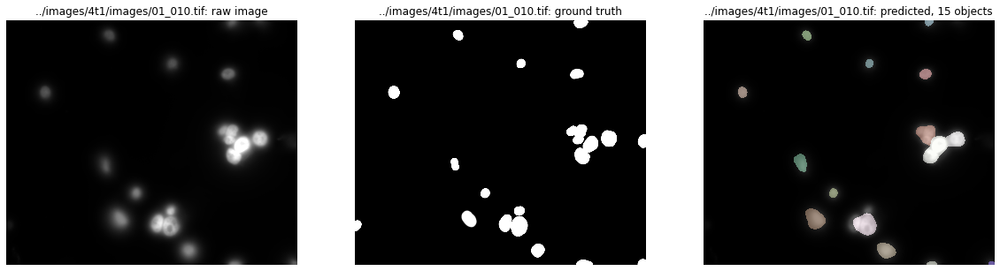

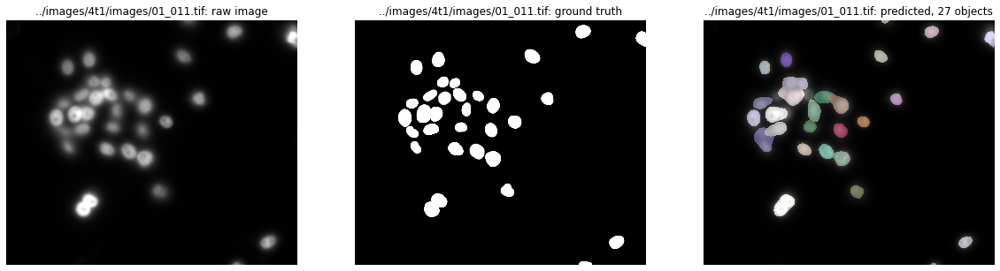

In [7]:
# Load model
pretrained_add10_stardist_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_10', 
                                 basedir='../0_pretrained_stardist_merfish_add_train/models')

# Predict
Y_pred = [pretrained_add10_stardist_model.predict_instances(x, n_tiles=pretrained_add10_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_pretrained_add10_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# StarDist model trained on U2OS nuclei images

Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.597232, nms_thresh=0.3.
  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
100%|██████████| 9/9 [00:34<00:00,  3.82s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=16, tp=248, fn=111, precision=0.9393939393939394, recall=0.6908077994428969, accuracy=0.6613333333333333, f1=0.7961476725521669, n_true=359, n_pred=264, mean_true_score=0.34684894270440897, mean_matched_score=0.5020918162535598, panoptic_quality=0.39973923091776187, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=47, tp=217, fn=142, precision=0.821969696969697, recall=0.6044568245125348, accuracy=0.5344827586206896, f1=0.6966292134831461, n_true=359, n_pred=264, mean_true_score=0.33207150710880246, mean_matched_score=0.5493717560002769, panop

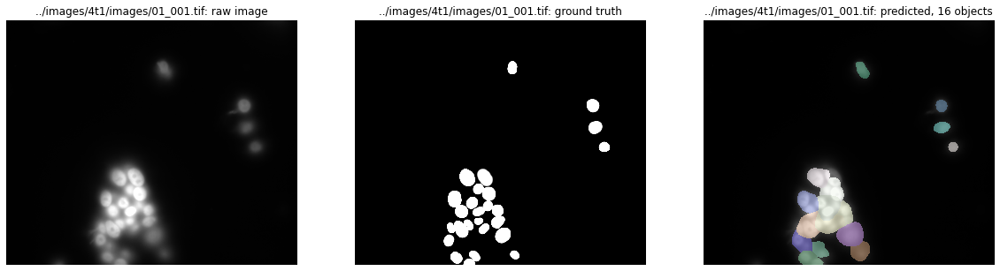

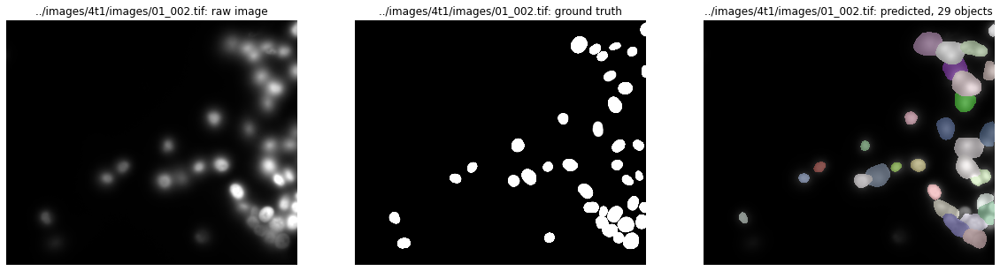

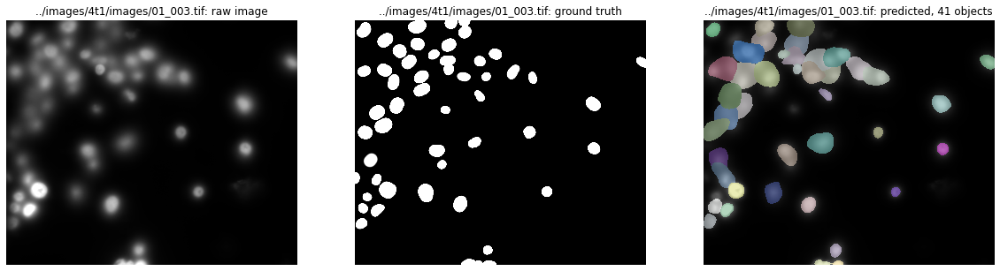

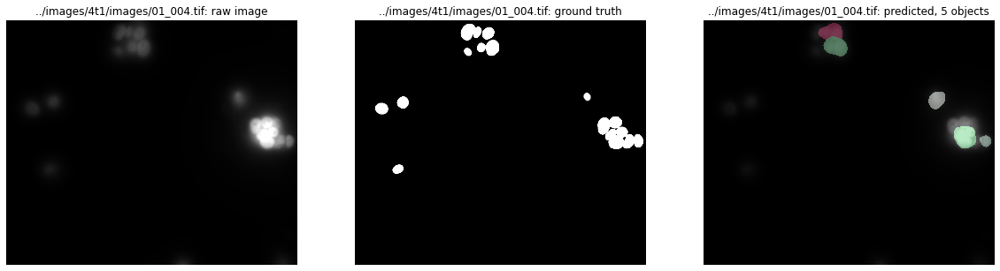

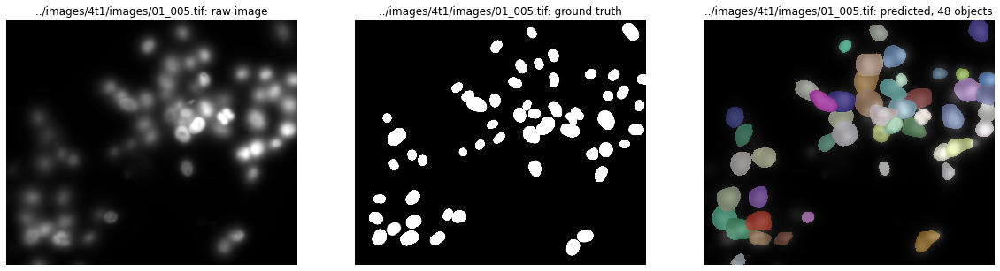

...

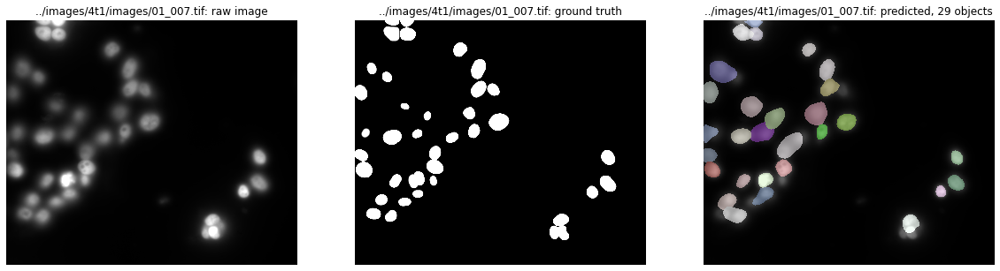

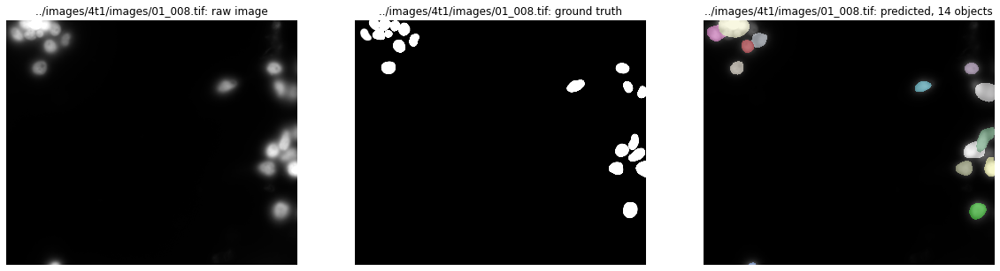

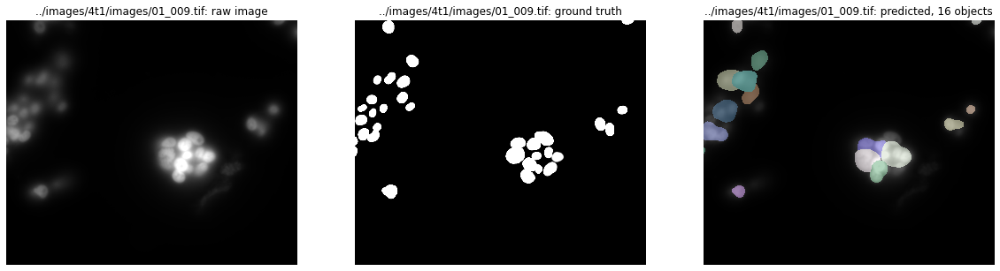

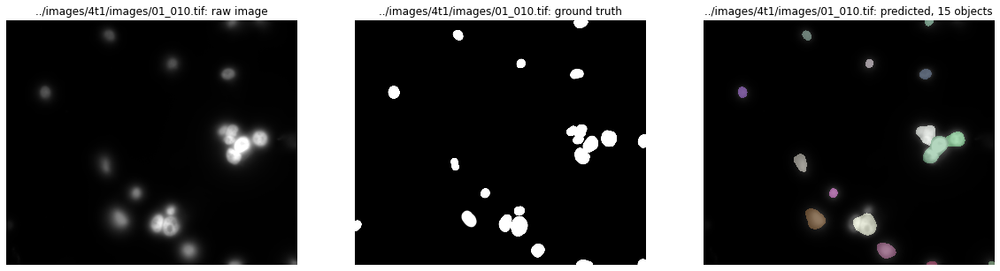

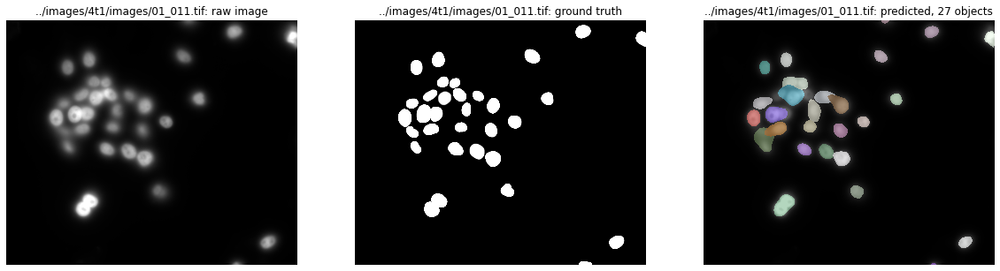

In [8]:
u2os_stardist_model = StarDist2D(None, 
                                 name='manual_mask_merfish_model', 
                                 basedir='../3_stardist_merfish_manual_seg/models') 
# Load model
u2os_stardist_model = StarDist2D(None, 
                                 name='2D_versatile_fluo_10', 
                                 basedir='../0_pretrained_stardist_merfish_add_train/models')

# Predict
Y_pred = [u2os_stardist_model.predict_instances(x, 
                                                n_tiles=u2os_stardist_model._guess_n_tiles(x),                                                           show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_u2os_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# SplineDist model trained in U2OS nuclei images


  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.

100%|██████████| 11/11 [03:09<00:00, 17.21s/it]

100%|██████████| 9/9 [00:21<00:00,  2.41s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=4, tp=205, fn=154, precision=0.9808612440191388, recall=0.5710306406685237, accuracy=0.5647382920110193, f1=0.721830985915493, n_true=359, n_pred=209, mean_true_score=0.28210687536023527, mean_matched_score=0.4940310646552413, panoptic_quality=0.3566069304729735, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=16, tp=193, fn=166, precision=0.9234449760765551, recall=0.5376044568245125, accuracy=0.5146666666666667, f1=0.6795774647887324, n_true=359, n_pred=209, mean_true_score=0.27660698770782416, mean_matched_score=0.5145176610731029, panoptic_quality=0.3496546077010876, by

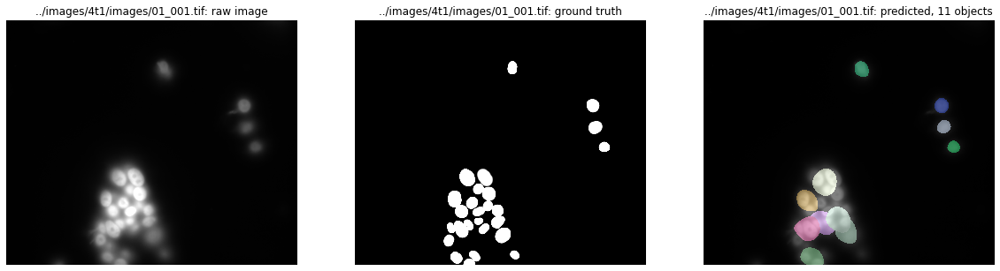

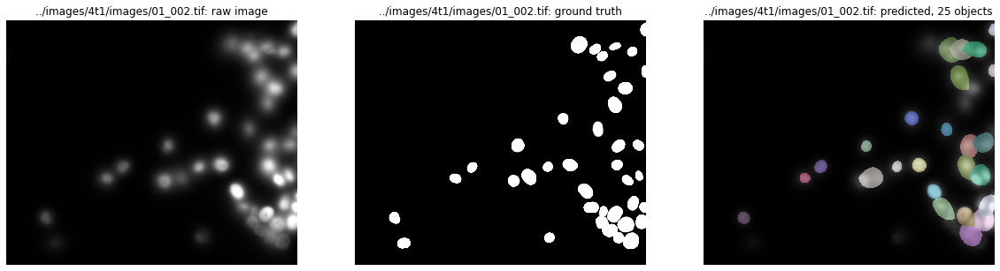

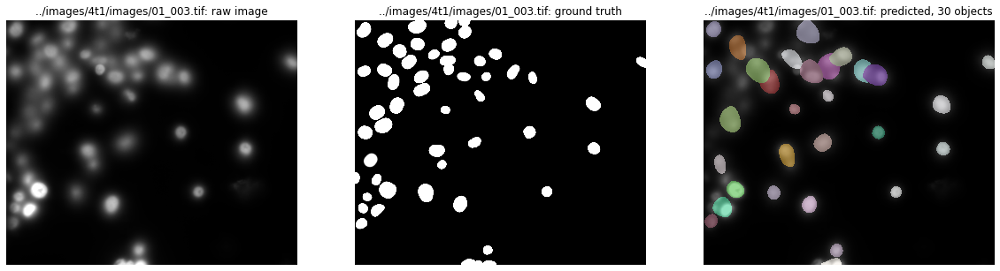

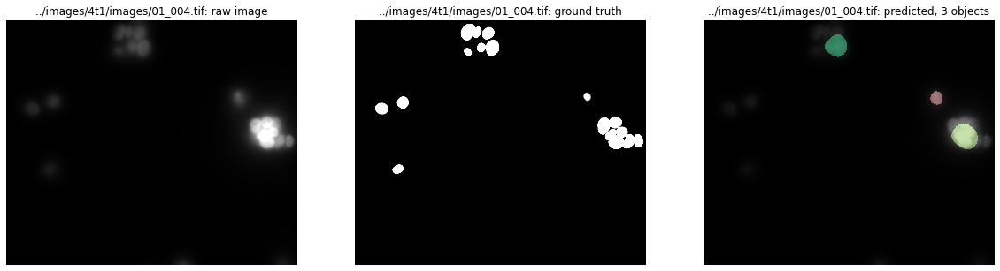

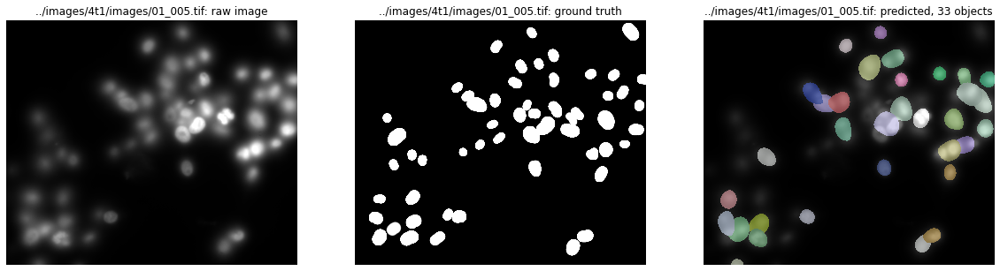

...

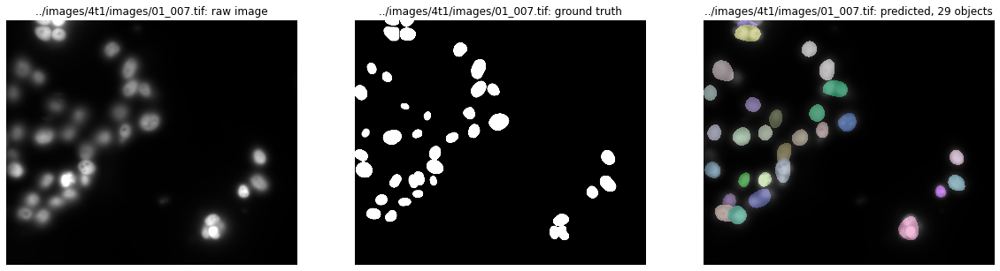

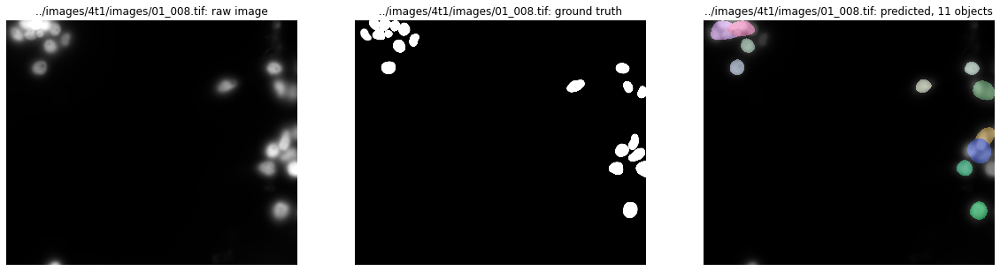

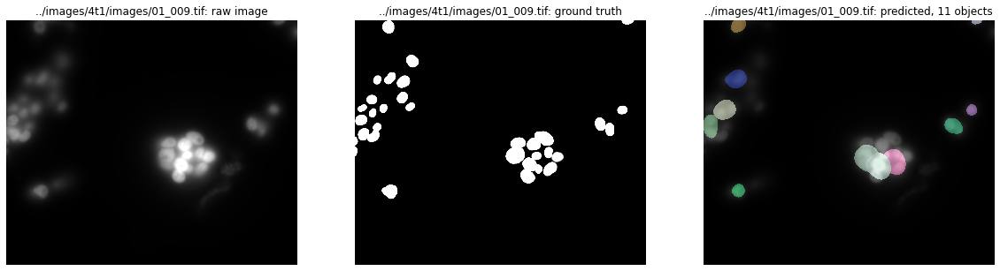

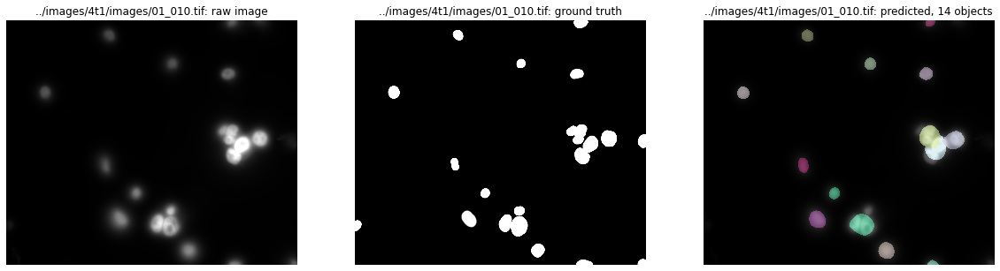

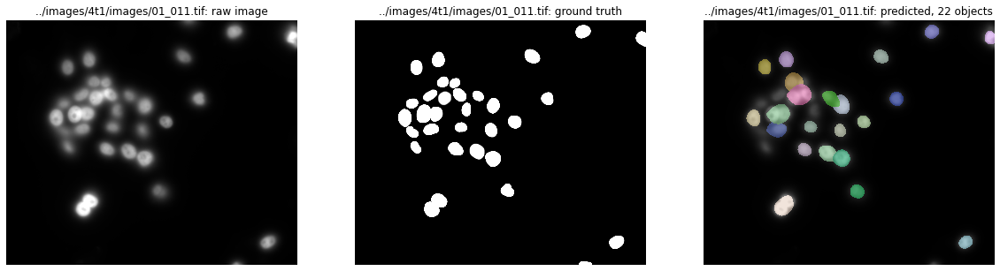

In [15]:
# Load model
u2os_splinedist_model = SplineDist2D(None, 
                                 name='splinedist_merfish', 
                                 basedir='../3_splinedist_merfish_manual_seg/models') 
# Predict
Y_pred = [u2os_splinedist_model.predict_instances(x, 
                                                  n_tiles=u2os_splinedist_model._guess_n_tiles(x),                                                         show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_u2os_splinedist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# Stardist model trained on U2OS nuclei images + Augmentation

## Flip/Rotation Augmenter


  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.458044, nms_thresh=0.3.

100%|██████████| 11/11 [03:12<00:00, 17.47s/it]

100%|██████████| 9/9 [00:21<00:00,  2.44s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=8, tp=215, fn=144, precision=0.9641255605381166, recall=0.5988857938718662, accuracy=0.5858310626702997, f1=0.738831615120275, n_true=359, n_pred=223, mean_true_score=0.3197514238549927, mean_matched_score=0.5339105170415925, panoptic_quality=0.3944699696355409, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=19, tp=204, fn=155, precision=0.9147982062780269, recall=0.5682451253481894, accuracy=0.5396825396825397, f1=0.7010309278350515, n_true=359, n_pred=223, mean_true_score=0.3147057922534821, mean_matched_score=0.5538204873480396, panoptic_quality=0.38824529009965664, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=44, tp

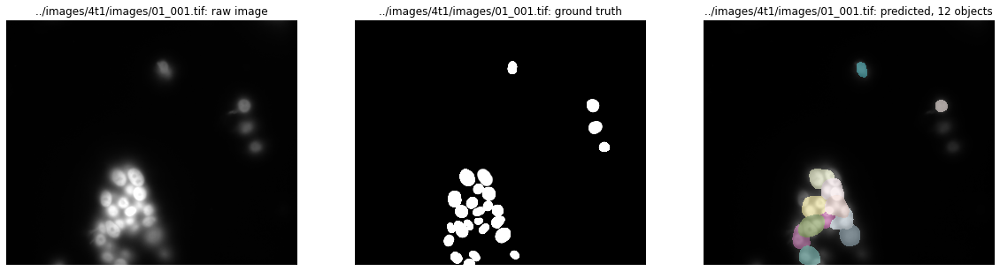

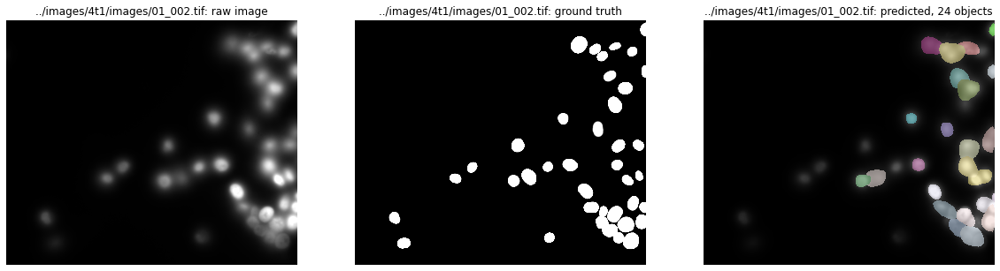

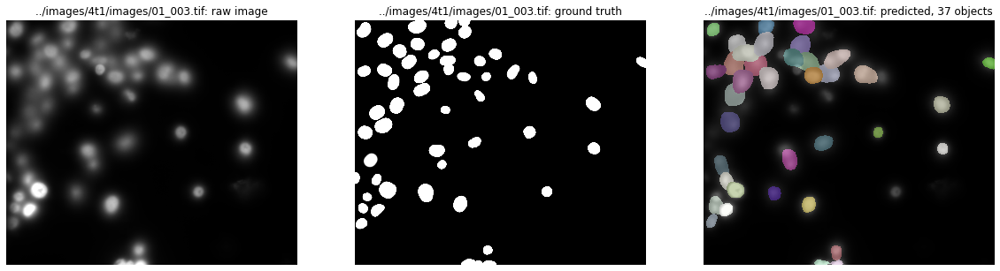

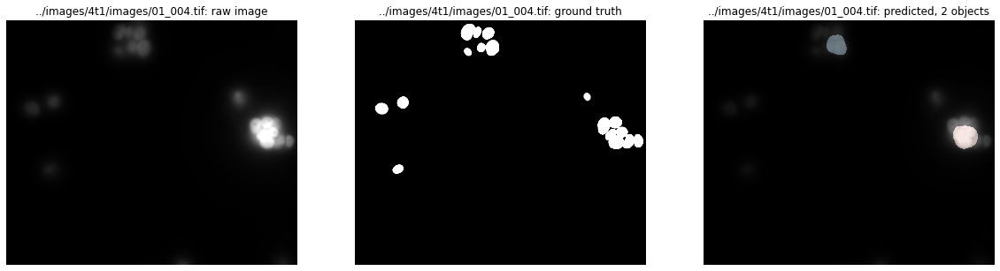

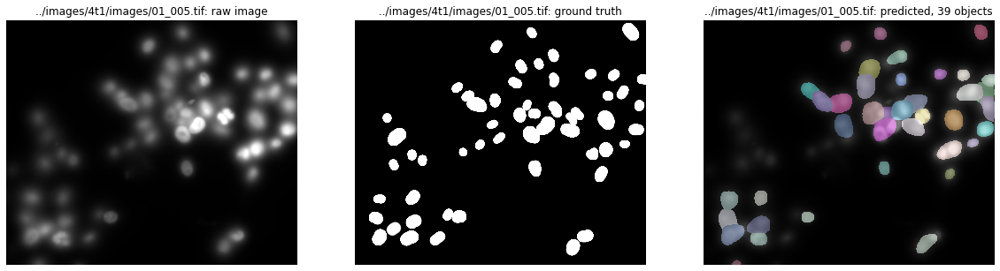

...

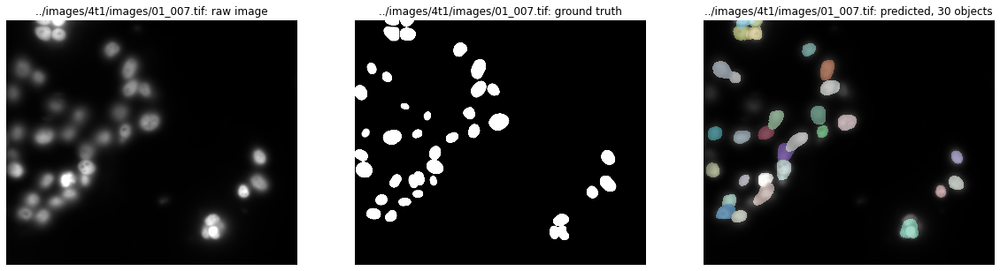

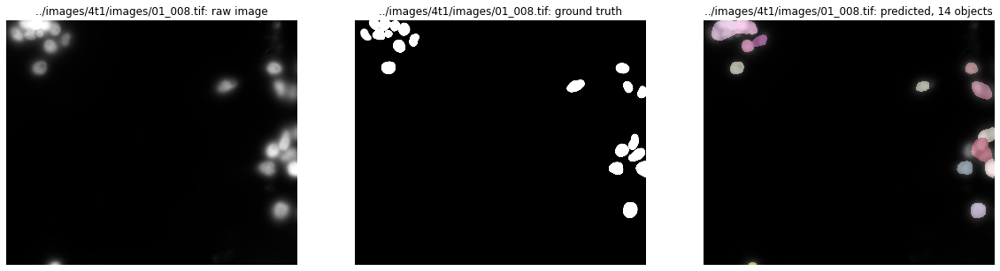

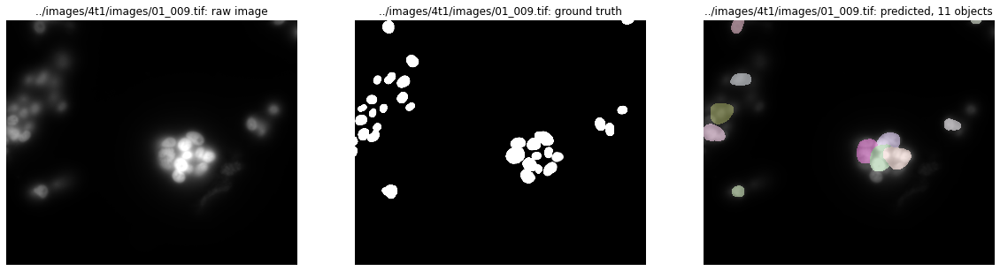

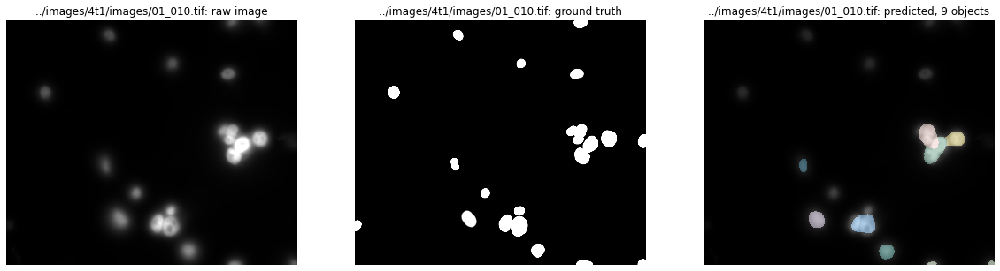

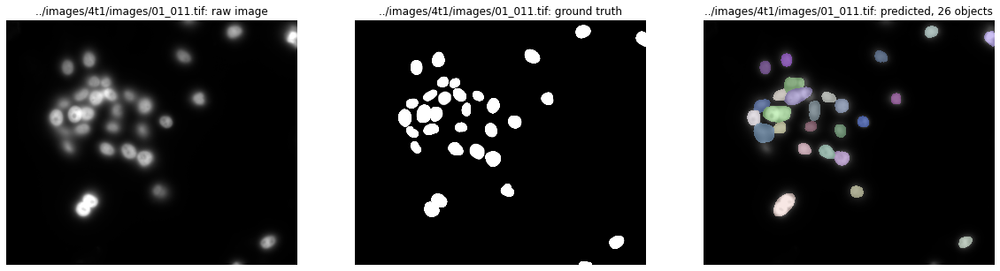

In [16]:
# Load model
fliprot_stardist_model = StarDist2D(None, 
                                    name='fliprot_aug_merfish_model', 
                                    basedir='../5_stardist_merfish_augmented/models') 
# Predict
Y_pred = [fliprot_stardist_model.predict_instances(x, 
                                                   n_tiles=fliprot_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_fliprot_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

## Intensity Augmenter


  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.543226, nms_thresh=0.3.

100%|██████████| 11/11 [02:32<00:00, 13.88s/it]

100%|██████████| 9/9 [00:20<00:00,  2.29s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=0, tp=103, fn=256, precision=1.0, recall=0.28690807799442897, accuracy=0.28690807799442897, f1=0.4458874458874459, n_true=359, n_pred=103, mean_true_score=0.18196221538423743, mean_matched_score=0.6342178186693325, panoptic_quality=0.28278976330277594, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=2, tp=101, fn=258, precision=0.9805825242718447, recall=0.28133704735376047, accuracy=0.27977839335180055, f1=0.43722943722943725, n_true=359, n_pred=103, mean_true_score=0.18096883199459454, mean_matched_score=0.6432456503570241, panoptic_quality=0.281245933705885, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=8, tp=95, fn=26

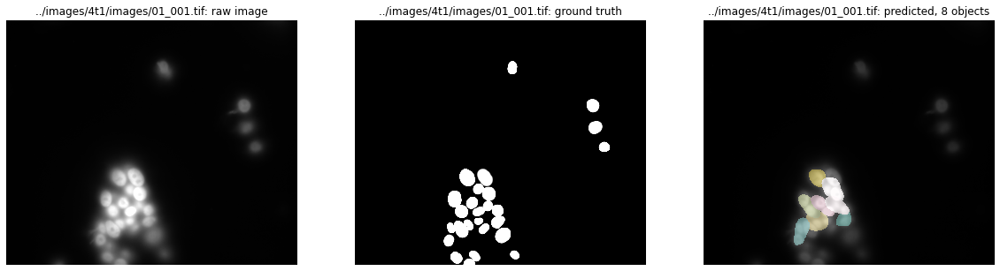

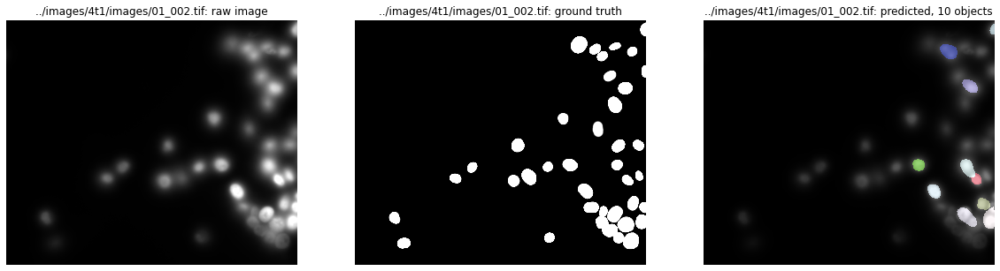

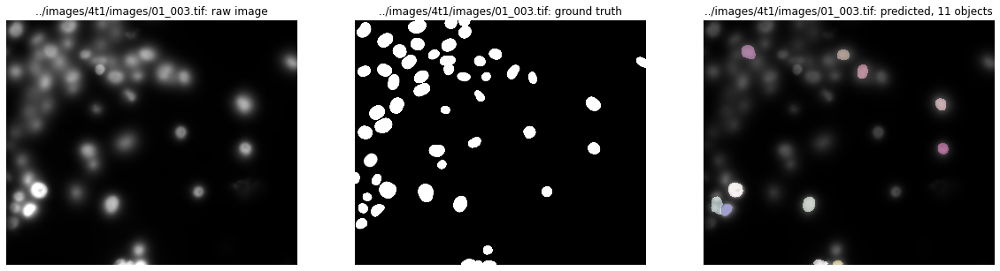

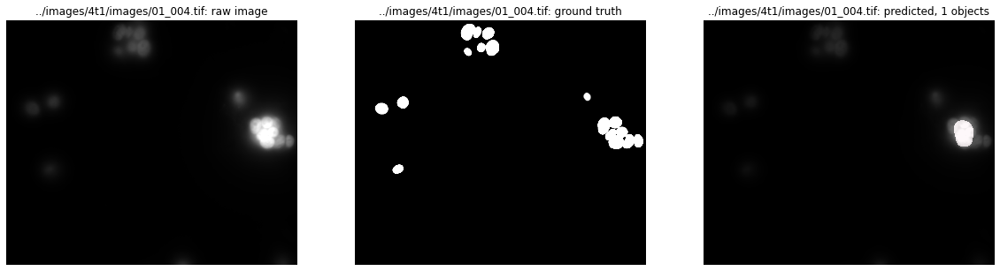

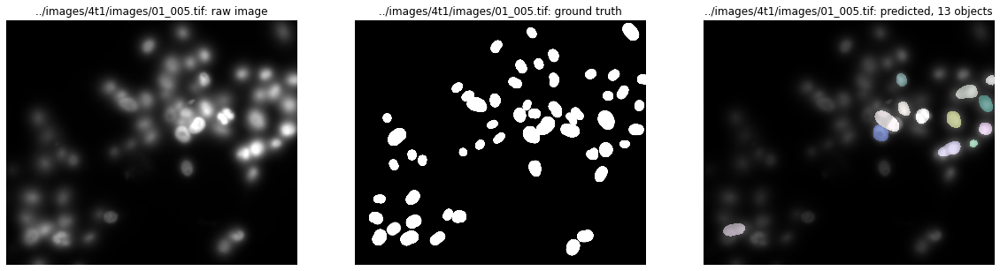

...

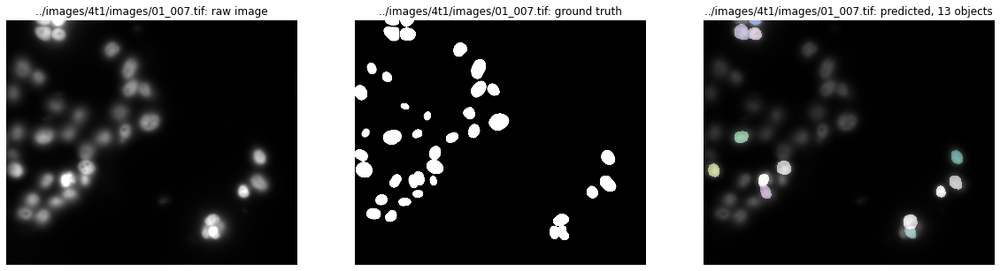

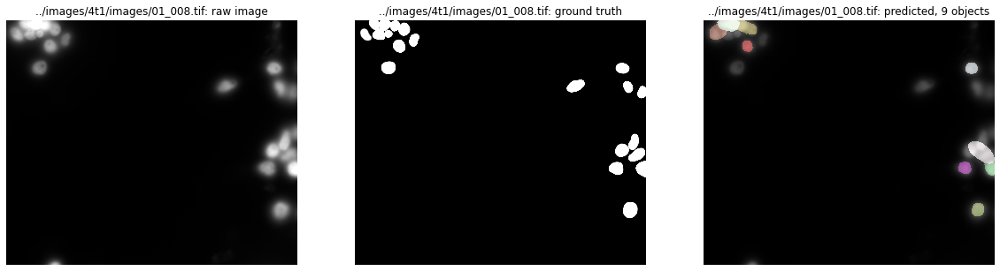

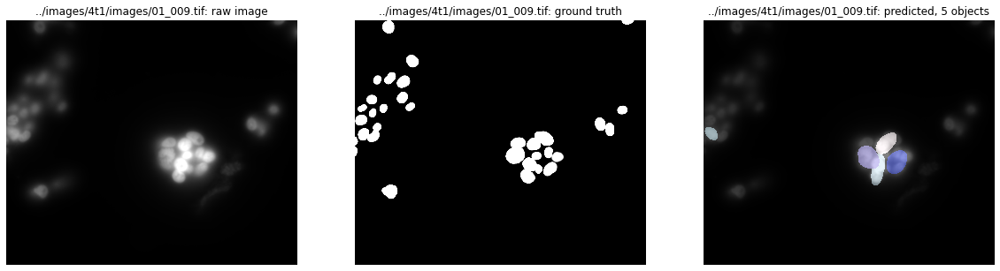

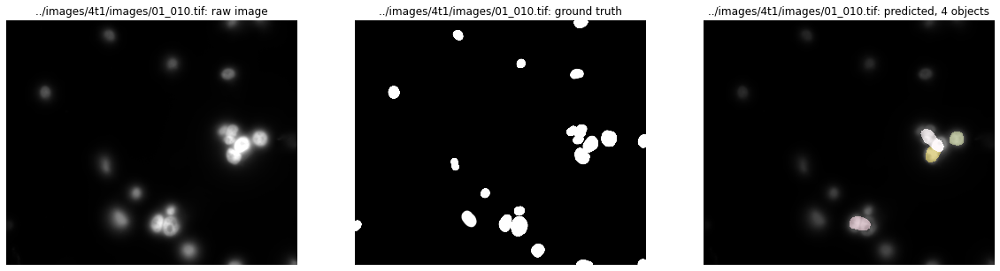

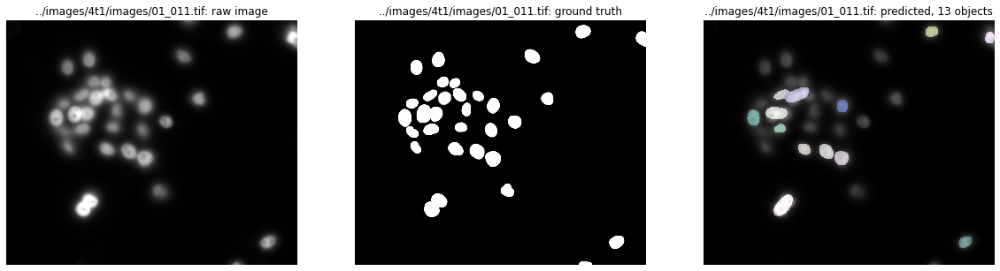

In [17]:
# Load model
intensity_stardist_model = StarDist2D(None, 
                                    name='intensity_aug_merfish_model', 
                                    basedir='../5_stardist_merfish_augmented/models') 
# Predict
Y_pred = [intensity_stardist_model.predict_instances(x, 
                                                   n_tiles=intensity_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_intensity_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

## Noise Augmenter


  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.663211, nms_thresh=0.3.

100%|██████████| 11/11 [03:02<00:00, 16.61s/it]

100%|██████████| 9/9 [00:26<00:00,  2.93s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=2, tp=204, fn=155, precision=0.9902912621359223, recall=0.5682451253481894, accuracy=0.5650969529085873, f1=0.7221238938053097, n_true=359, n_pred=206, mean_true_score=0.28597583557881306, mean_matched_score=0.5032613969254602, panoptic_quality=0.36341707954971286, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=13, tp=193, fn=166, precision=0.9368932038834952, recall=0.5376044568245125, accuracy=0.5188172043010753, f1=0.6831858407079646, n_true=359, n_pred=206, mean_true_score=0.28095460503673453, mean_matched_score=0.5226046798351695, panoptic_quality=0.35703611755110687, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=49

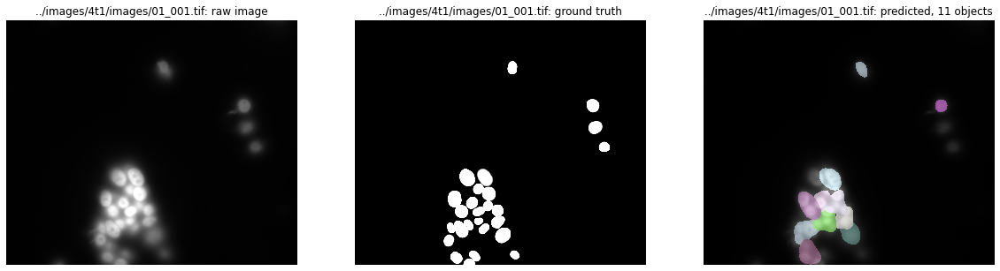

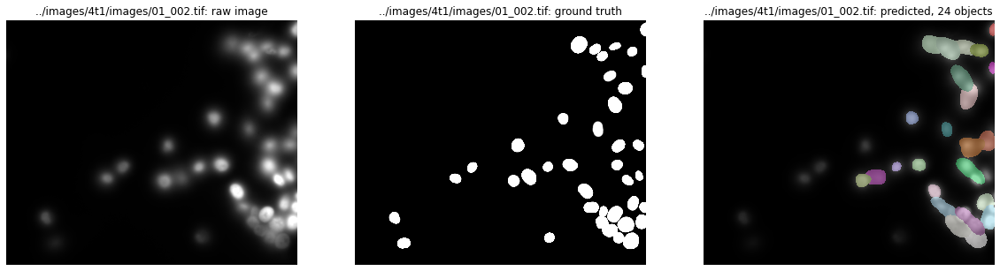

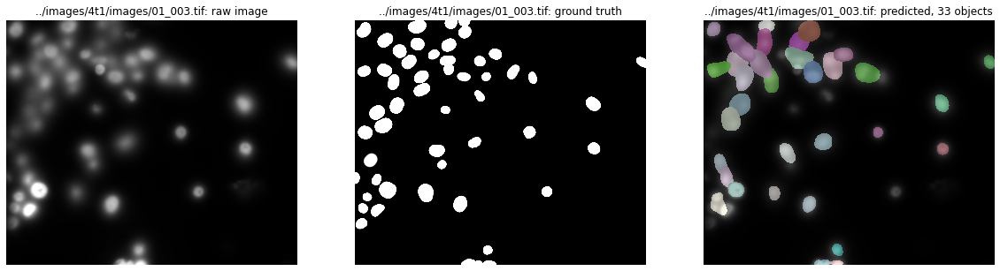

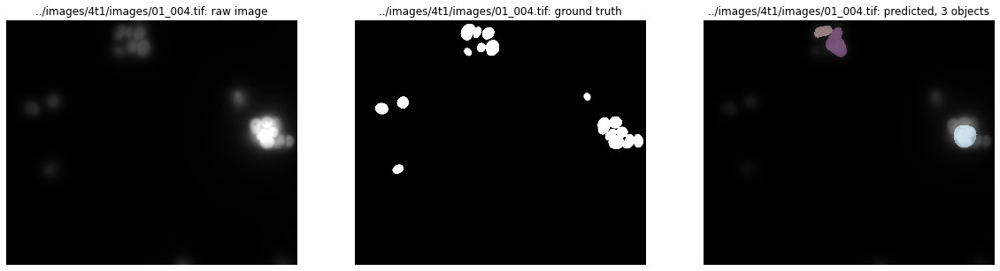

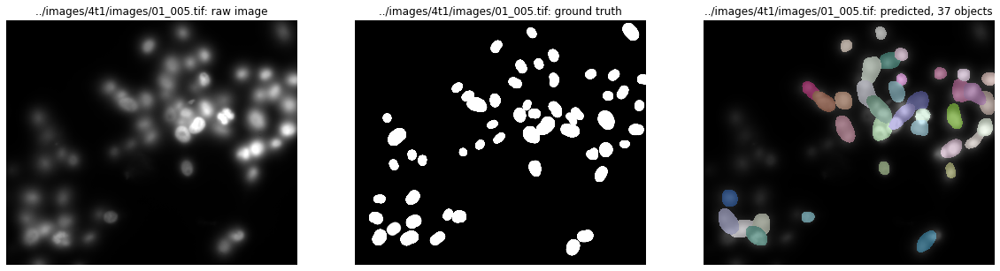

...

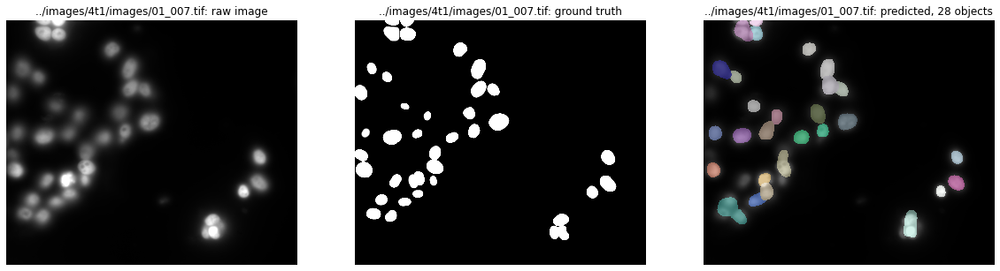

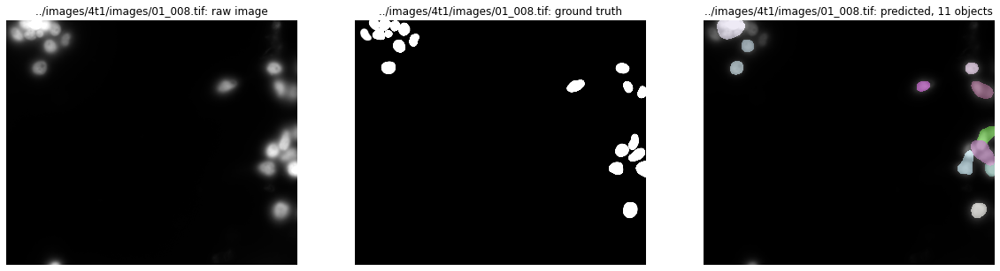

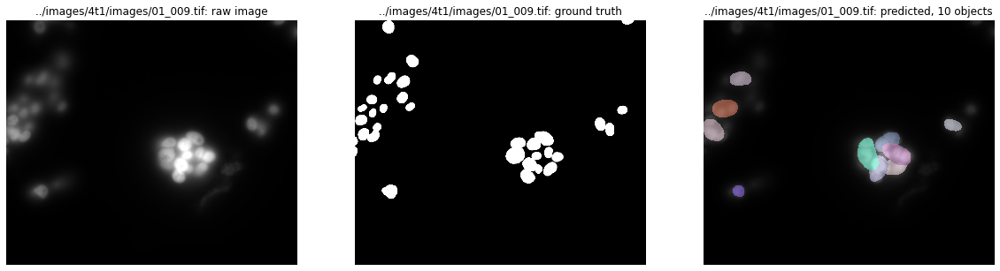

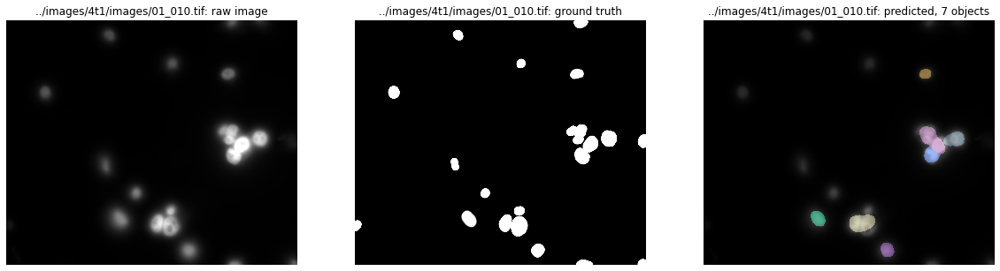

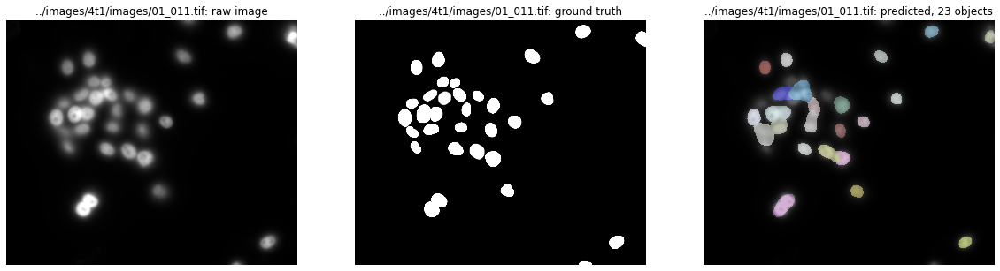

In [18]:
# Load model
noise_stardist_model = StarDist2D(None, 
                                    name='noise_aug_merfish_model', 
                                    basedir='../5_stardist_merfish_augmented/models') 
# Predict
Y_pred = [noise_stardist_model.predict_instances(x, 
                                                   n_tiles=noise_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_noise_stardist')

# Show images
show_test_images(X_test, Y_test, Y_pred, X_test_names)

# StarDist model trained on smFISH Images

In [8]:
# Load all smfish images
smfish_X_test_names = glob(f'{smfish_4t1_dir}/images/*.tif')
smfish_X_test_names.sort(key=lambda name: name[-6:])
smfish_X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, smfish_X_test_names))]

  0%|          | 0/11 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.780102, nms_thresh=0.3.
100%|██████████| 9/9 [00:20<00:00,  2.31s/it]
[DatasetMatching(criterion='iou', thresh=0.1, fp=74, tp=187, fn=172, precision=0.7164750957854407, recall=0.520891364902507, accuracy=0.43187066974595845, f1=0.603225806451613, n_true=359, n_pred=261, mean_true_score=0.1521490157406761, mean_matched_score=0.2920935649780894, panoptic_quality=0.1761983762932346, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=122, tp=139, fn=220, precision=0.5325670498084292, recall=0.3871866295264624, accuracy=0.288981288981289, f1=0.4483870967741935, n_true=359, n_pred=261, mean_true_score=0.1315151948578307, mean_matched_score=0.33966874067598, panoptic_quality=0.1523030804966491, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=182, tp=79, fn=280, precision=0.30268199233716475, recall=0

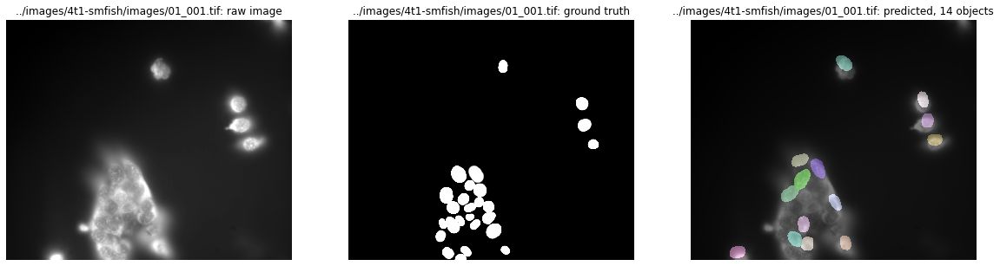

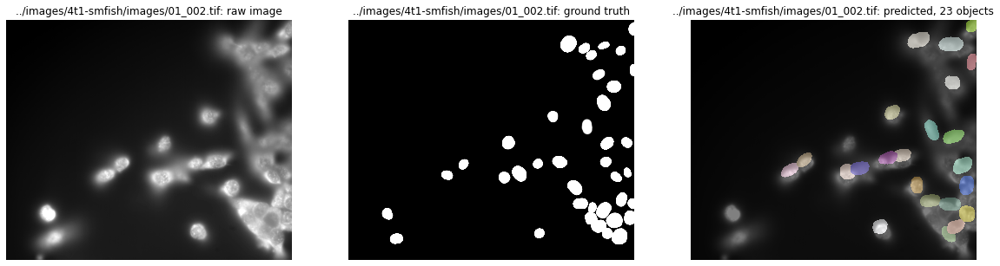

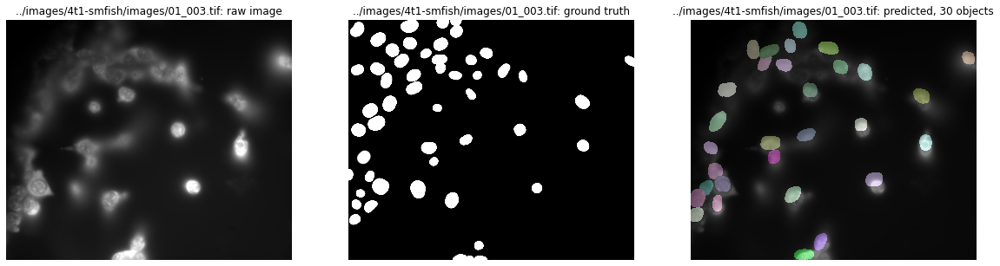

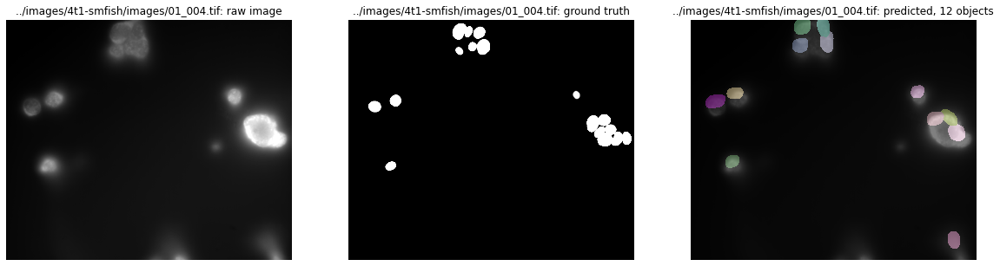

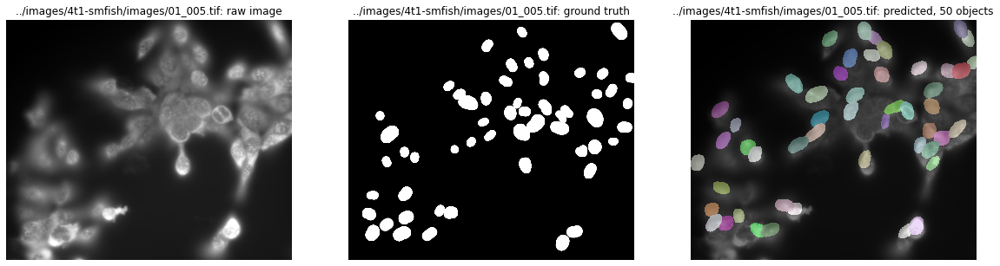

...

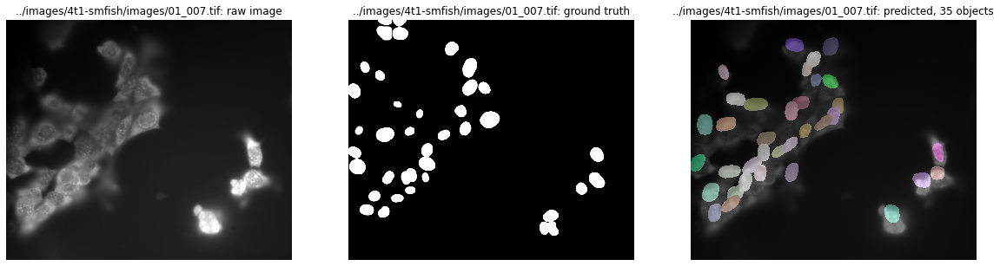

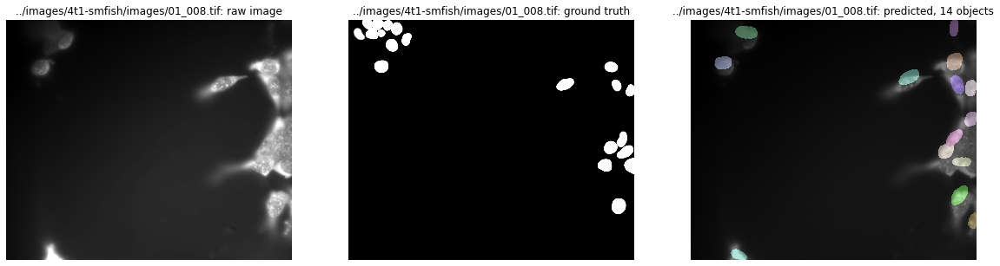

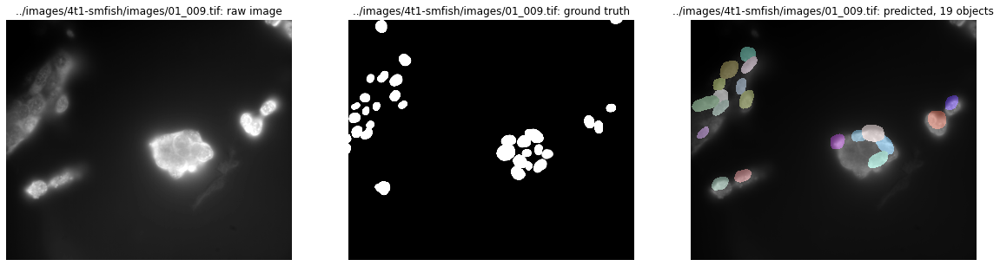

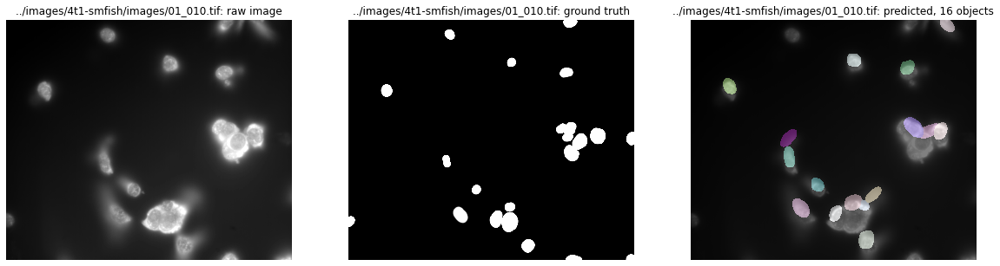

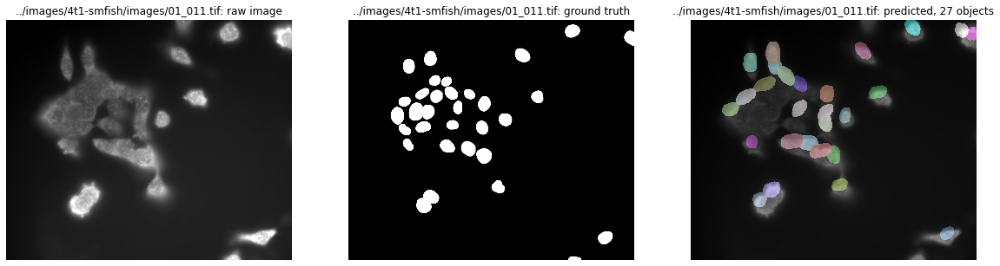

In [10]:
# Load model
smfish_stardist_model = StarDist2D(None, 
                                    name='smfish_nuclei_model', 
                                    basedir='../6_smfish_nuclei/models') 
# Predict
Y_pred = [smfish_stardist_model.predict_instances(x, 
                                                   n_tiles=smfish_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(smfish_X_test)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_smfish_stardist')

# Show images
show_test_images(smfish_X_test, Y_test, Y_pred, smfish_X_test_names)

# Watershed

In [13]:
X_test_no_normalize = list(map(cv.imread, X_test_names))

In [14]:
X_test_no_normalize[0].dtype

dtype('uint8')

In [25]:
# Using best parameters for U2OS cells
scores = evaluate_all(X_test_no_normalize, Y_test, {'alpha': 0.5,
                                                    'beta': 15,
                                                    'blur_ksize': 3,
                                                    'dilate_itr': 4,
                                                    'foreground_thresh_ratio': 0.5,
                                                    'morph_kernel': np.array([[1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1],
                                                                              [1, 1, 1, 1, 1]],                                                                                               dtype=np.uint8),
                                                    'opening_itr': 3,
                                                    'thresh_method': 8,
                                                    'upper_limit': 236})

In [27]:
taus = [0.6, 0.7, 0.8, 0.9]

for tau in taus:
    tp = scores[0][tau]
    fp = scores[1][tau]
    fn = scores[2][tau]

    f1 = f1_score(tp, fp, fn)
    avg_prec = avg_precision(tp, fp, fn)
    print(f'threshold = {tau}, f1 = {f1}, average precision = {avg_prec}')

threshold = 0.6, f1 = 0.052884615384615384, average precision = 0.027160493827160494
threshold = 0.7, f1 = 0.03365384615384615, average precision = 0.017114914425427872
threshold = 0.8, f1 = 0.03365384615384615, average precision = 0.017114914425427872
threshold = 0.9, f1 = 0.009615384615384616, average precision = 0.004830917874396135


In [ ]:
# Get best parameters
get_best_params(X_test_no_normalize, Y_test, param_tries = 300)

# Pretrained StarDist model + 10 Additional U2OS images + Additional 4t1 Images

In [3]:
# Load images in test dirs
X_test_small_names = glob(f'{nuclei_4t1_dir}/test/images/*.tif')
X_test_small_names.sort(key=lambda name: name[-6:])
X_test_small = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, X_test_small_names))]

# Load masks in test dirs
Y_test_small_names = glob(f'{nuclei_4t1_dir}/test/masks/*.tif')
Y_test_small_names.sort(key=lambda name: name[-6:])
Y_test_small = list(map(io.imread, Y_test_small_names))

  0%|          | 0/2 [00:00<?, ?it/s]Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.
100%|██████████| 9/9 [00:05<00:00,  1.65it/s]
[DatasetMatching(criterion='iou', thresh=0.1, fp=1, tp=47, fn=2, precision=0.9791666666666666, recall=0.9591836734693877, accuracy=0.94, f1=0.9690721649484536, n_true=49, n_pred=48, mean_true_score=0.7567606855331998, mean_matched_score=0.7889632678963147, panoptic_quality=0.7645623420850884, by_image=False), DatasetMatching(criterion='iou', thresh=0.2, fp=1, tp=47, fn=2, precision=0.9791666666666666, recall=0.9591836734693877, accuracy=0.94, f1=0.9690721649484536, n_true=49, n_pred=48, mean_true_score=0.7567606855331998, mean_matched_score=0.7889632678963147, panoptic_quality=0.7645623420850884, by_image=False), DatasetMatching(criterion='iou', thresh=0.3, fp=2, tp=46, fn=3, precision=0.9583333333333334, recall=0.9387755102040817, accuracy=0.9019607843137

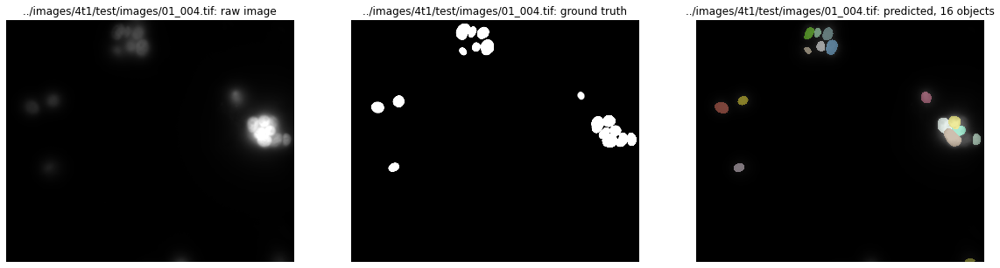

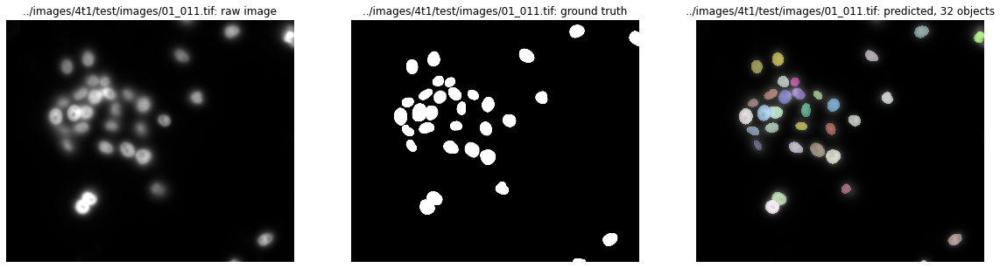

In [4]:
# Load model
pretrained_add10_add4t1_stardist_model = StarDist2D(None, 
                                    name='2D_versatile_fluo_10_u2os_5', 
                                    basedir='./models') 
# Predict
Y_pred = [pretrained_add10_add4t1_stardist_model.predict_instances(x, 
                                                   n_tiles=pretrained_add10_add4t1_stardist_model._guess_n_tiles(x),                                                        show_tile_progress=False)
          for x in tqdm(X_test_small)]

# Generate scores for each threshold
Y_pred_labels = [pred[0] for pred in Y_pred]
stats = [matching_dataset(Y_test_small, Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

# Show scores
print(stats)

# Save scores
save_scores_csv(stats, '_add4t1_stardist')

# Show images
show_test_images(X_test_small, Y_test_small, Y_pred, X_test_small_names)